In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
plt.style.use('dark_background')
import numpy as np
import scipy as sp
plt.rcParams['image.origin'] = 'lower' 
from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from astropy.coordinates import SkyCoord
import astropy.coordinates as coord
from radio_beam import Beam
from astropy.io import fits
from astropy.units import cds
import astropy.units as u

gzip was not found on your system! You should solve this issue for astroquery.eso to be at its best!
On POSIX system: make sure gzip is installed and in your path!On Windows: same for 7-zip (http://www.7-zip.org)!


In [2]:
%run get_and_plot_vizier_nir.py

In [3]:
#%run get_and_plot_vizier_nir.py
%run functions.py

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im2,
          norm=visualization.simple_norm(stars_background_im2, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [8]:
stars_background_im2, turbulent_stars2, turbulence2, header2 = get_and_plot_vizier_nir()

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\table\column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


ValueError: The `bounding_box` is larger than the input out in one or more dimensions. Set `model.bounding_box = None`.

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im2, norm=visualization.simple_norm(stars_background_im2, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [8]:
np.min(stars_background_im2), np.max(stars_background_im2)

(72.8430207717295, 22143228359.982742)

In [4]:
x = np.array([1023,250,10])
y = np.array([1023,250,10])
source_table = Table({'amplitude': np.array([1e50,5e22, 1e20]),
                          'x_mean': x, #np.array([0,0,0]),
                          'y_mean': y, #np.array([0,0,0]),
                          'x_0': x,
                          'y_0': y,
                          'radius': np.array([2,2,2]),
                          'x_stddev' : abs(1.2 * (x - 1024)/4096 * (x - 1024)/4096),
                          'y_stddev' : abs(0.8 * (x + 1024)/4096 * (x - 1024)/4096),
                          'theta' : np.pi * (x-1024),
                         })
shape = [2048, 2048]
airy_radius = 3.2

In [5]:
image1 = make_model_sources_image_faster(shape, airy_radius, source_table,
                                    bbox_size=10,
                                    progressbar=False)

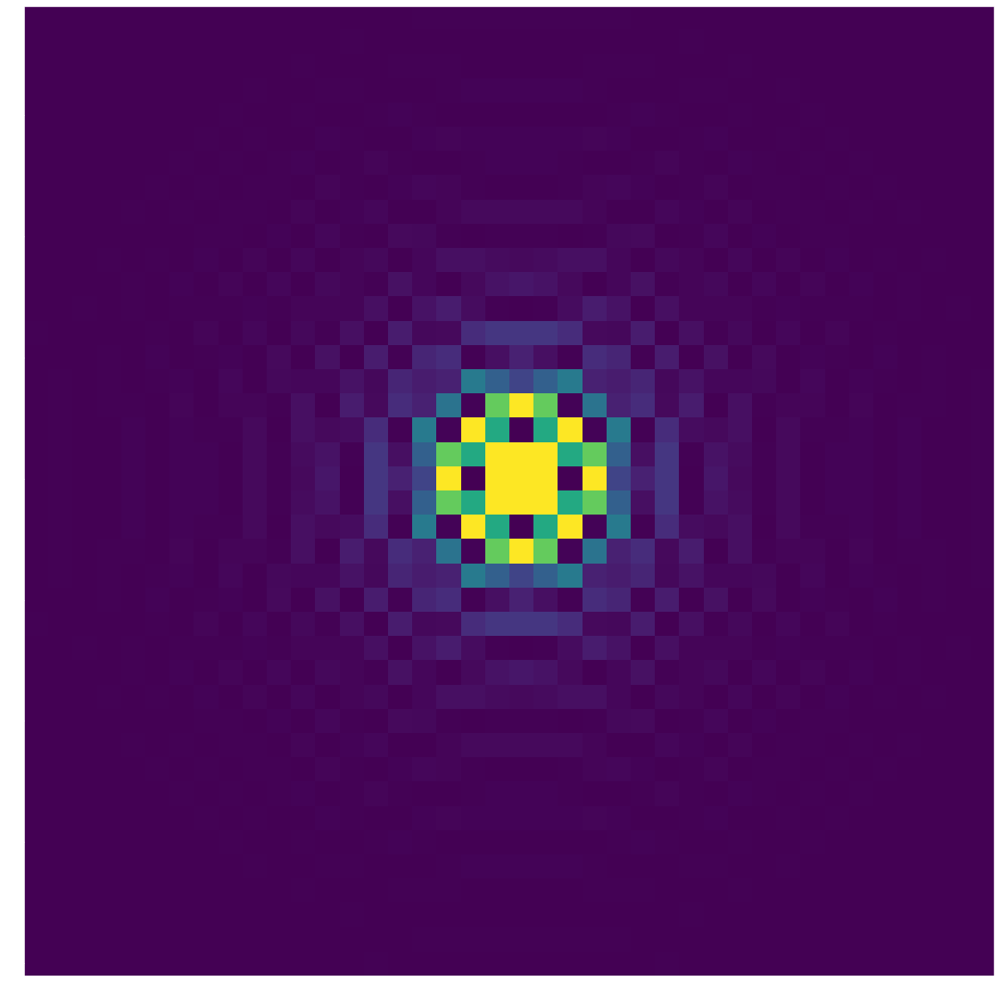

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(image1[1003:1043, 1003:1043], vmax=1e48)

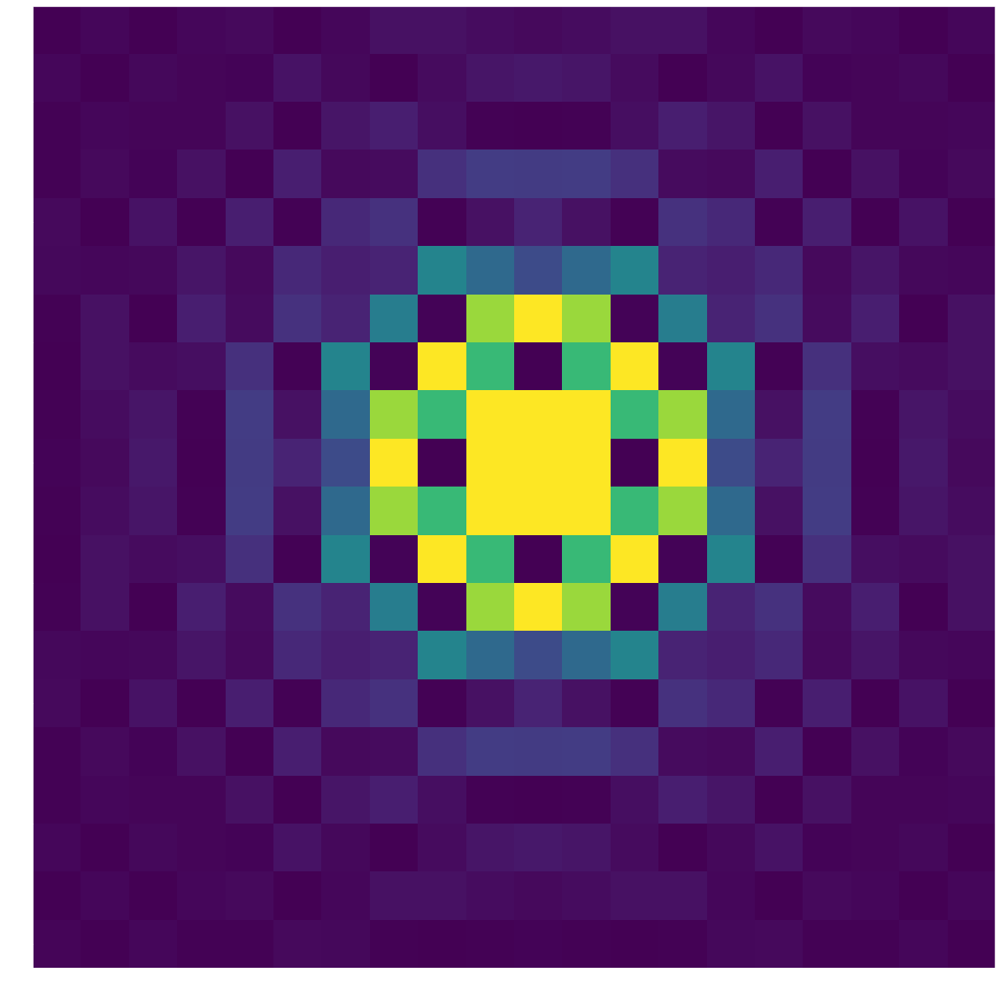

In [12]:
plt.figure(figsize=(20,20))
plt.imshow(image1[0:20, 0:20], vmax = 9e+17)

In [7]:
np.unravel_index(image1.argmin(), image1.shape), np.unravel_index(image1.argmax(), image1.shape), image1.min(), image1.max()

((1025, 1023), (1023, 1023), -1.1959491131528202e+33, 1e+50)

In [8]:
loc = np.where(image1 != 0),
loc

((array([   0,    0,    0, ..., 1043, 1043, 1043], dtype=int64),
  array([   0,    1,    2, ..., 1041, 1042, 1043], dtype=int64)),)

In [4]:
stars_background_im = make_stars_im(1000, nstars=100)

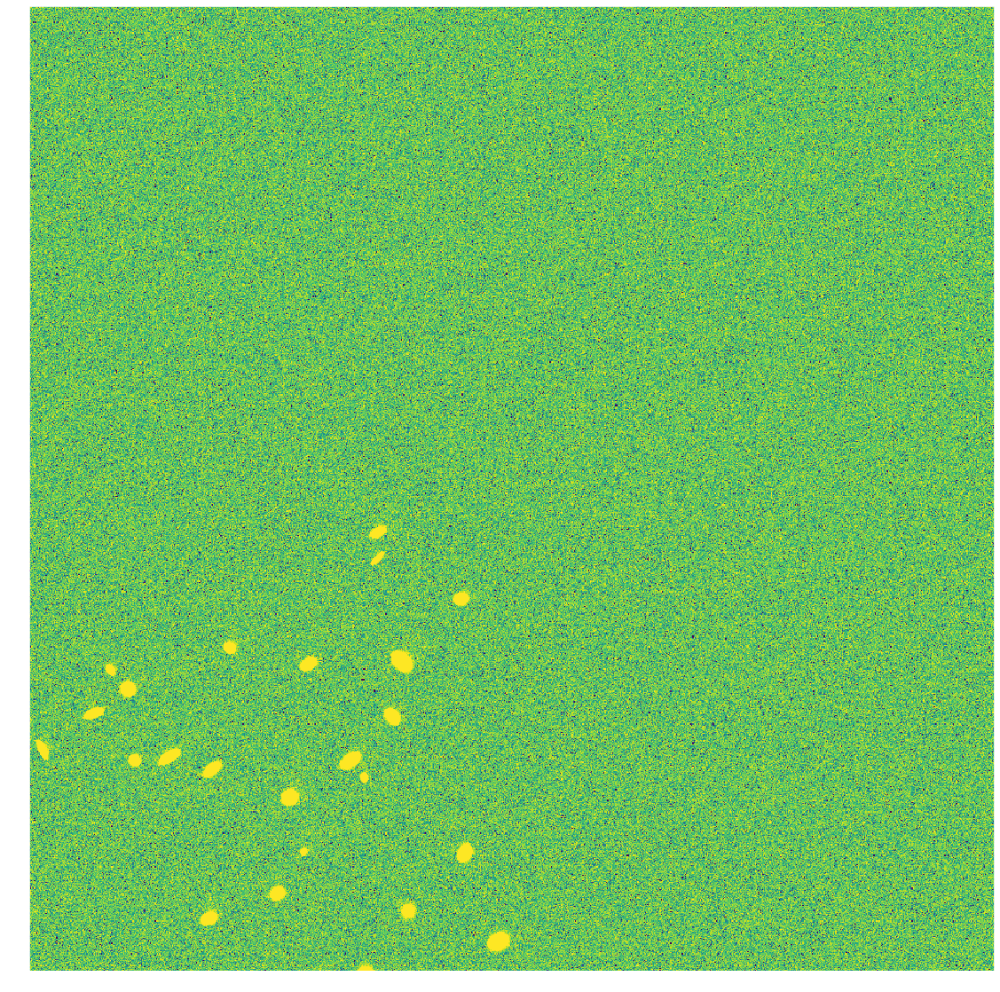

In [5]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im,
          norm=visualization.simple_norm(stars_background_im, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [7]:
#MWE
#numbers are random bc i haven't found any that change the outcome
from astropy.convolution import convolve_models, Gaussian2DKernel
from astropy.modeling import models
g1 = models.Gaussian2D(amplitude=2, x_mean=7, y_mean=6, x_stddev=9, y_stddev=10, theta=11)
g2 = models.AiryDisk2D(amplitude=7, x_0=7, y_0=6, radius=1)
g3 = convolve_models(g2, g1)
g3([0],[0])

array([1.32433848e-08])

In [6]:
g1, g2, g3

(<Gaussian2D(amplitude=2., x_mean=0., y_mean=0., x_stddev=9., y_stddev=10., theta=11.)>,
 <AiryDisk2D(amplitude=7., x_0=0., y_0=0., radius=1.)>,
 <CompoundModel(amplitude_0=7., x_0_0=0., y_0_0=0., radius_0=1., amplitude_1=2., x_mean_1=0., y_mean_1=0., x_stddev_1=9., y_stddev_1=10., theta_1=11.)>)

In [68]:
# this example shows that setting x_mean=0, y_mean=0 puts the peak at the right location
yy,xx = np.mgrid[-5:5:0.1,-5:5:0.1]
g1 = models.AiryDisk2D(amplitude=0.5, x_0=1, y_0=1)
g2 = models.Gaussian2D(amplitude=3, x_mean=0, y_mean=0, x_stddev=0.1, y_stddev=0.2, theta=np.pi/4)
g3forward_eval = convolve_models(g1,g2)(xx,yy)
g3reverse_eval = convolve_models(g2,g1)(xx,yy)
forward_argmax = np.argmax(g3forward_eval)
reverse_argmax = np.argmax(g3reverse_eval)
print(f"forward peak = {xx.flat[forward_argmax]}, {yy.flat[forward_argmax]} (should be 1,1)")
print(f"reverse peak = {xx.flat[reverse_argmax]}, {yy.flat[reverse_argmax]} (should be 1,1)")

# this example shows that setting x_mean=-1.5, y_mean=-2 puts the peak at the wrong location
yy,xx = np.mgrid[-5:5:0.1,-5:5:0.1]
g1 = models.AiryDisk2D(amplitude=0.5, x_0=1, y_0=1)
g2 = models.Gaussian2D(amplitude=3, x_mean=-1.5, y_mean=-2, x_stddev=0.1, y_stddev=0.2, theta=np.pi/4)
g3forward_eval = convolve_models(g1,g2)(xx,yy)
g3reverse_eval = convolve_models(g2,g1)(xx,yy)
forward_argmax = np.argmax(g3forward_eval)
reverse_argmax = np.argmax(g3reverse_eval)
print(f"forward peak = {xx.flat[forward_argmax]}, {yy.flat[forward_argmax]} (should be 1,1)")
print(f"reverse peak = {xx.flat[reverse_argmax]}, {yy.flat[reverse_argmax]} (should be 1,1)")


forward peak = 1.0, 1.0 (should be 1,1)
reverse peak = 1.0, 1.0 (should be 1,1)
forward peak = -0.5, -1.0 (should be 1,1)
reverse peak = -0.5, -1.0 (should be 1,1)


In [93]:
image2 = np.zeros([2048,2048], dtype=np.float64)

In [95]:
g3forward_eval = convolve_models(g1,g2)
g3reverse_eval = convolve_models(g2,g1)
g3forward_eval.render(image2)
#g3reverse_eval.render(image2)

array([[ 1.03687075e+40,  1.07833011e+40,  7.57764706e+39, ...,
        -7.58609003e+30, -9.03898269e+29, -4.67682108e+29],
       [ 1.07833011e+40,  7.52456174e+39,  2.90580733e+39, ...,
        -1.59226636e+30,  3.51349901e+30, -5.40959178e+30],
       [ 7.57764706e+39,  2.90580733e+39,  1.22140332e+38, ...,
         3.67894678e+29, -4.10850390e+30,  3.88048857e+30],
       ...,
       [ 7.42495107e+29,  5.85467058e+29, -5.08468457e+30, ...,
         4.11047258e+29,  2.42467101e+30,  3.74456521e+30],
       [-3.77978984e+30, -1.81143631e+29, -1.42508176e+30, ...,
        -1.21154294e+30, -4.49652158e+29, -1.22816422e+30],
       [-2.05788249e+30, -2.68576169e+29,  4.55896202e+30, ...,
        -2.34309530e+29, -3.12247465e+30,  2.77489705e+30]])

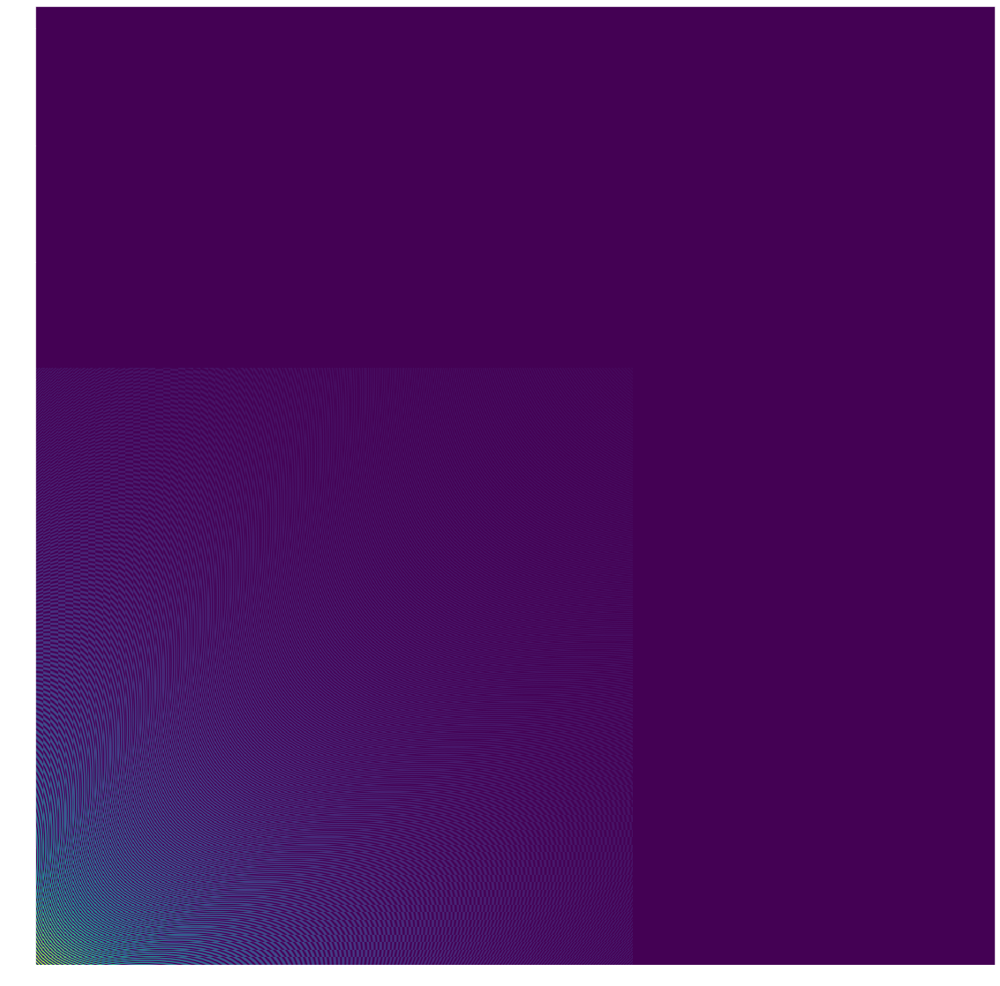

In [96]:
plt.figure(figsize=(20,20))
plt.imshow(image2)

In [97]:
loc2 = np.where(image2 != 0),
loc2

((array([   0,    0,    0, ..., 2047, 2047, 2047], dtype=int64),
  array([   0,    1,    2, ..., 2045, 2046, 2047], dtype=int64)),)

In [98]:
np.unravel_index(image2.argmin(), image2.shape), np.unravel_index(image2.argmax(), image2.shape), image2.min(), image2.max()

((500, 1620), (7, 1), -3.1775559212742334e+32, 1.0871253693242324e+40)

In [5]:
stars_background_im1, turbulent_stars1, turbulence1, header1 = get_and_plot_vizier_nir(zero=False, imsize=512, fov=5*u.arcmin)

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\table\column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


In [10]:
stars_background_im2, turbulent_stars2, turbulence2, header2 = get_and_plot_vizier_nir(zero=False)

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\table\column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


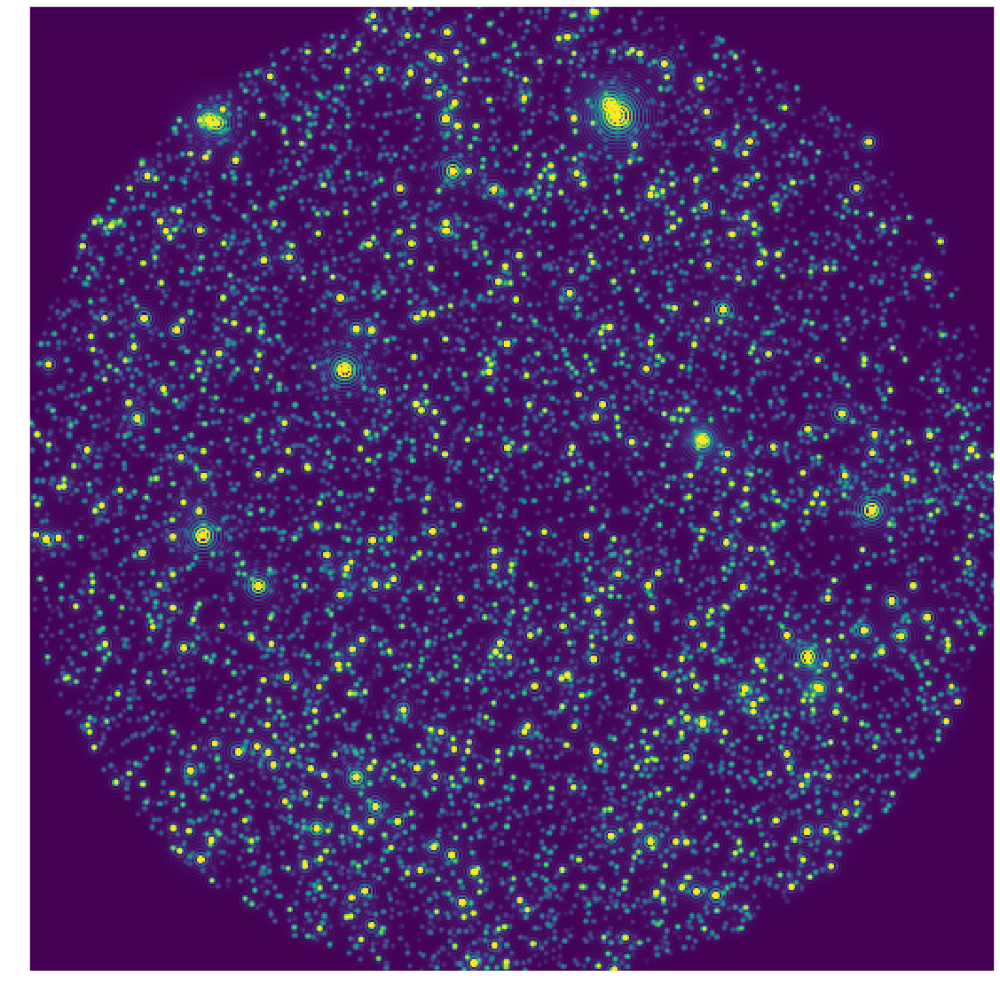

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im1, norm=visualization.simple_norm(stars_background_im1, stretch='asinh',
                                         max_percent=99, min_percent=1))

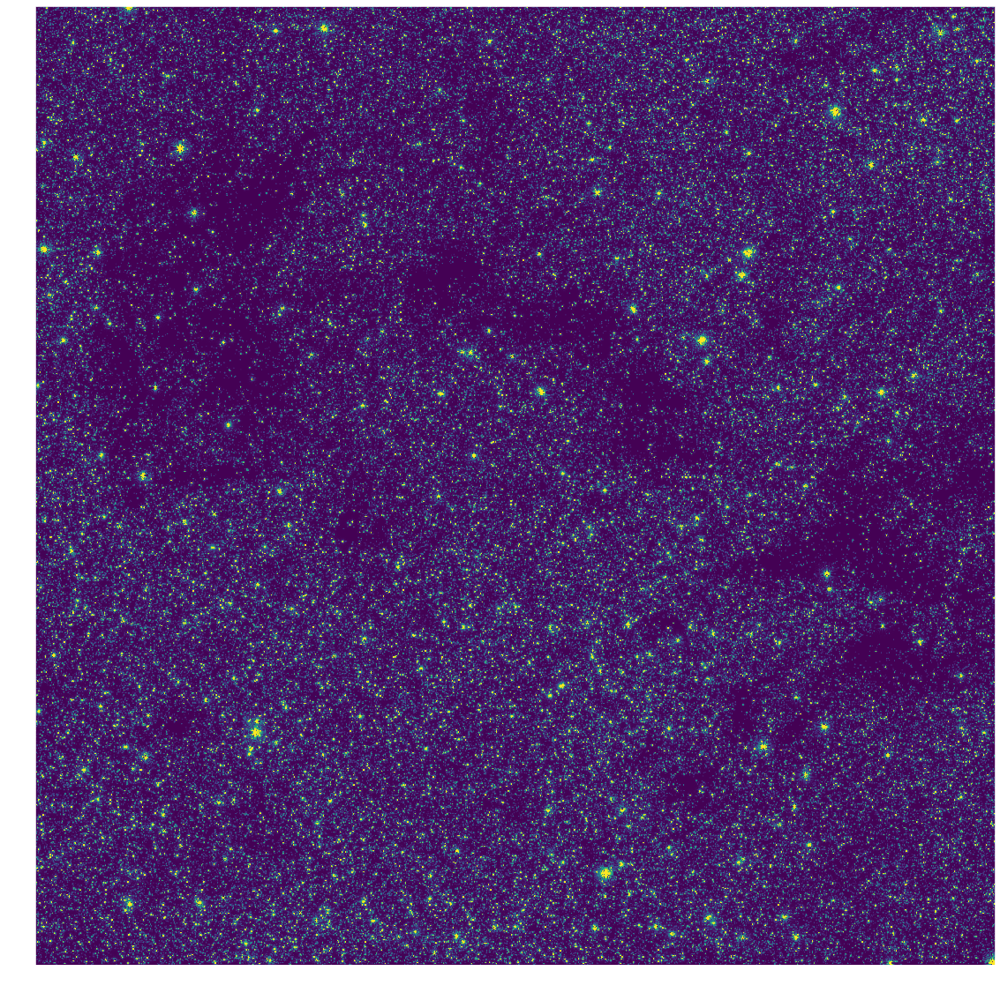

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(stars_background_im2, norm=visualization.simple_norm(stars_background_im2, stretch='asinh',
                                         max_percent=99, min_percent=1))

In [100]:
source3 = source1[0:100]
source4 = source2[0:100]
source3

amplitude,x_mean,y_mean,x_0,y_0,radius,x_stddev,y_stddev,theta
,,,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64
170.15097669068953,511.80677886310013,298.8569270924493,511.80677886310013,298.8569270924493,2.439158107372999,0.026565554115602606,0.017710369410401737,-1609.102460742177
227.58105903084078,506.377020730533,311.656622379537,506.377020730533,311.656622379537,2.439158107372999,0.026373288730629375,0.01758219248708625,-1626.1605490022193
147.02780935548304,506.93222693589746,316.8998897507206,506.93222693589746,316.8998897507206,2.439158107372999,0.026151085806368084,0.01743405720424539,-1624.4163172662188
146.79241817386588,511.599535685878,292.5480304961964,511.599535685878,292.5480304961964,2.439158107372999,0.026807522449295136,0.017871681632863425,-1609.7535343852446
97.26179731533219,500.6435174584726,336.3384723515537,500.6435174584726,336.3384723515537,2.439158107372999,0.02574149024171048,0.017160993494473656,-1644.1728807610573
144.25046223875646,498.6896547966568,339.5864958559765,498.6896547966568,339.5864958559765,2.439158107372999,0.025715553340224746,0.0171437022268165,-1650.3111213455413
292.6956627597221,455.4280882649814,87.0461442608287,455.4280882649814,87.0461442608287,2.439158107372999,0.03810350739706403,0.02540233826470935,-1786.2213409442388
86.79636246800082,443.9396767632042,76.08212912572091,443.9396767632042,76.08212912572091,2.439158107372999,0.039328304284663405,0.026218869523108937,-1822.3132501196383


In [101]:
x2 = source3['x_0']
y2 = source3['y_0']
source_table2 = Table({'amplitude': source3['amplitude'],
                          'x_mean': np.round(x2),
                          'y_mean': np.round(y2),
                          'x_0': x2,
                          'y_0': y2,
                          'radius': source3['radius'],
                          'x_stddev' : source3['x_stddev'],
                          'y_stddev' : source3['y_stddev'],
                          'theta' : source3['theta'],
                         })

In [102]:
image3 = make_model_sources_image_faster([2048,2048], 3.2, source_table2,
                                    bbox_size=10,
                                    progressbar=False)

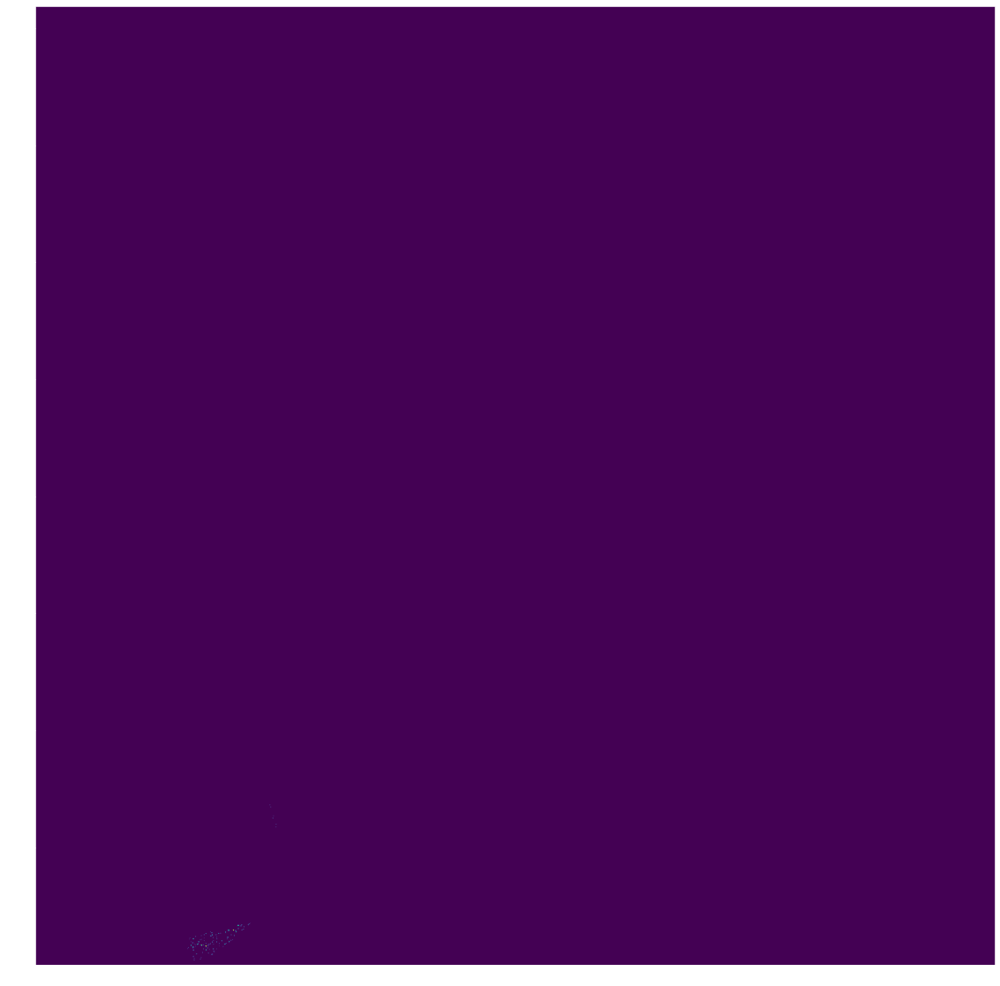

In [104]:
plt.figure(figsize=(20,20)); plt.imshow(image3)

In [95]:
np.max(image3)

260.85514614952064